# Advanced-Lane-Lines Project

## Init

In [58]:
import os, sys
import numpy as np
import cv2
import pickle
import glob
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# pretty formatting of np float arrays
float_formatter = lambda x: "%10.4f" % x
np.set_printoptions(formatter={'float_kind' : float_formatter})


#############################################################################
# Constants and variables
#############################################################################

# Turns debugging images on
image_output= True 

# Plot size for plotting images with matplotlib in inches
plot_size = (12, 12)

# amount of corners on chessboard pattern
nx, ny = 9, 6
cam_calib_file = "cam_calib_params.p"

# list of calibration images
calib_files = glob.glob("./camera_cal/calibration*.jpg")
test_files  = glob.glob("./test_images/*.jpg")

# Parameters for ROI selection
roi_height = 0.6
dist_from_side = 0.48 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255



# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None


## Helper functions
Some of them have been used during *P2 - Finding lane*.

In [29]:
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)


def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    return cv2.bitwise_and(img, mask)


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


def filter_and_extrapolate_lines(lines, image, slope_threshold_low = 0.5, slope_threshold_high = 0.8, verbose=False):
    """
    Filter out lines and assign lines to the left or right lane group according to their slope.
    The line equation is: y = m*x + b
    When we detect a line with a positive slope and a value greater than the pos_threshold
    it gets assigned to the left group, if the slope is negative and smaller than the negative
    threshold it gets assigned to the right group.
    
    At the end we do a linear regression line fitting for both the left and right lane lines.
    """

    if len(lines) == 0:
        print("No lines in array!")
        return []

    if verbose: 
        print("Extracting lane from %d lines" % len(lines))
    
    lane_lines  = []
    left_idx    = []
    right_idx   = []
    outlier_cnt = 0
    
    minimum_y = image.shape[0] 
    maximum_y = image.shape[0]

    # filter out lines and assign them to the left or right lane group
    for i, line in enumerate(lines):
        for x1,y1,x2,y2 in line:
            deltX = x2-x1
            deltY = y2-y1
            slope = deltY / deltX
            length = np.sqrt(deltX**2 + deltY**2)
            # TODO: use also length as criterion for line selection...

            # if positive slope, assign to right lane group
            if (slope > slope_threshold_low and slope < slope_threshold_high): 
                if verbose: print("\tFound left lane line with slope=%.2f and length=%.2f" % (slope, length)) 
                right_idx.append(i)

            # if negative slope, assign to left lane group
            elif (slope < -slope_threshold_low and slope > -slope_threshold_high): 
                if verbose: print("\tFound right lane line with slope=%.2f and length=%.2f" % (slope, length))
                left_idx.append(i)

            # this must be an outlier
            else:
                if verbose: print("\tFound outlier line with slope=%.2f and length=%.2f" % (slope, length))
                outlier_cnt+=1

            # update the min y (horizon)
            minimum_y = min(min(y1, y2), minimum_y)

    if verbose:
        print("Result: %d left, %d right and %d outlier detected" % (len(left_idx), len(right_idx), outlier_cnt))

    if len(right_idx) == 0 or len(left_idx) == 0:
        print("Couldn't detect both road lanes in the list of lines, %d left and %d right :(" % \
             (len(left_idx), len(right_idx)))
        return []

    # pick out xs and ys from lines array
    left_xs  = np.array(lines[left_idx][:, :, 0:3:2]).flatten()
    left_ys  = np.array(lines[left_idx][:, :, 1:4:2]).flatten()
    right_xs = np.array(lines[right_idx][:, :, 0:3:2]).flatten()
    right_ys = np.array(lines[right_idx][:, :, 1:4:2]).flatten()
    
    # run linear regression for line fitting over collected points for both left and right lane
    left_slope,  left_intercept  = np.polyfit(left_xs,  left_ys, 1)
    right_slope, right_intercept = np.polyfit(right_xs, right_ys, 1)

    # calculate pixel coordinates to describe the left and right lane line
    left_x1  = int((minimum_y - left_intercept)  / left_slope)
    left_x2  = int((maximum_y - left_intercept)  / left_slope)
    right_x1 = int((minimum_y - right_intercept) / right_slope)
    right_x2 = int((maximum_y - right_intercept) / right_slope)

    # define the final found lines based on two points and return them
    lane_lines.append([[left_x1,  minimum_y, left_x2,  maximum_y]])
    lane_lines.append([[right_x1, minimum_y, right_x2, maximum_y]])

    return lane_lines


def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    ysize = image.shape[0]
    xsize = image.shape[1]
    line_img = np.zeros(image.shape, dtype=np.uint8)
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    # first smooth image to get better results during edge detection
    img = gaussian_blur(S, kernel_size)
    gray = canny(img, canny_low_threshold, canny_high_threshold)

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),   \
                          (xsize*dist_from_side,     ysize*roi_height), \
                          (xsize*(1-dist_from_side), ysize*roi_height), \
                          (xsize,                    ysize) \
                         ]], dtype=np.int32)
    masked_img = region_of_interest(gray, vertices)

    # extracting straight lines from edges
    lines = cv2.HoughLinesP(masked_img, hough_rho, hough_theta, hough_threshold, np.array([]), \
                            hough_min_line_len, hough_max_line_gap)

    if annotate_all_lines:
        draw_lines(line_img, lines, color=[0, 255, 0], thickness=4)
    lines2 = filter_and_extrapolate_lines(lines, image, slope_threshold_low, slope_threshold_high, verbose=False)

    draw_lines(line_img, lines2, color=[255, 0, 0], thickness=10)
    combined_img = weighted_img(line_img, image)
    return combined_img

## Camera calibration

In [31]:
if not os.path.isfile(cam_calib_file):
    # Do a fresh cam calibration!
    
    # 3D points in real world space:
    objpoints = []
    # 2D points in image plane:
    imgpoints = []
    
    # Prepare object points like (0,0,0), ... (nx, ny, 0) for one chess calibration pattern
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:, 0:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    for file in calib_files:
        img = mpimg.imread(file)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == False:
            print("Couldn't detect (%d, %d) corners in image %s" % (nx, ny, file))
            continue

        # if corners are found add object points and image points
        imgpoints.append(corners)
        objpoints.append(objp)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open(cam_calib_file, "wb" ) )

else:
    # load camera calibration parameters from pickle file
    with open(cam_calib_file, mode='rb') as f:
        dist_pickle = pickle.load(f)
    print("Loaded camera calibration from file %s" % cam_calib_file)

print(dist_pickle)

Loaded camera calibration from file cam_calib_params.p
{'mtx': array([[1153.9609,  0.0000, 669.7054],
       [ 0.0000, 1148.0250, 385.6562],
       [ 0.0000,  0.0000,  1.0000]]), 'dist': array([[-0.2410, -0.0531, -0.0012, -0.0001,  0.0267]])}


** Visualizing camera calibration **

Showing undistorted 5 random images from calibration dataset:


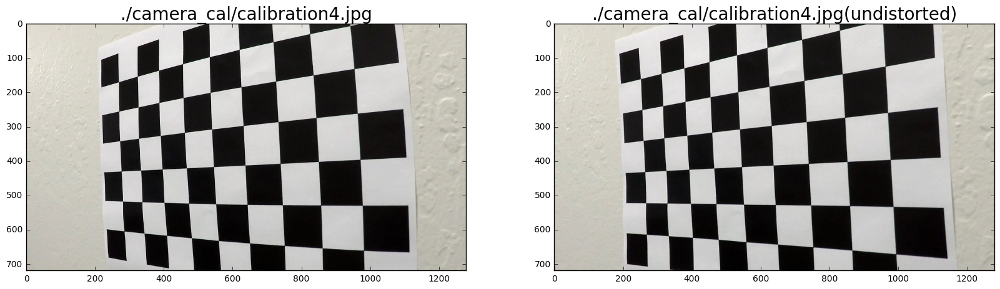

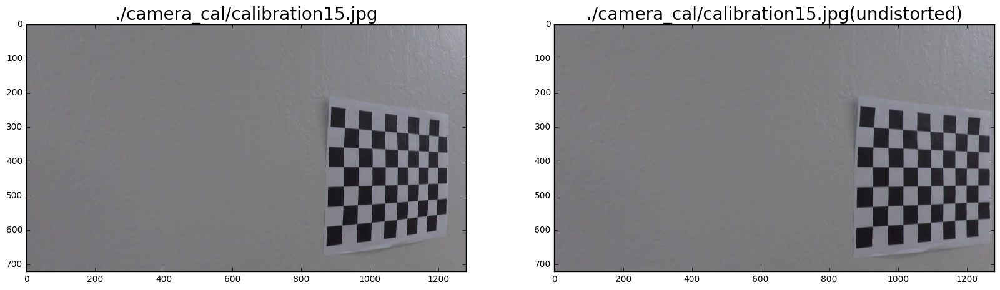

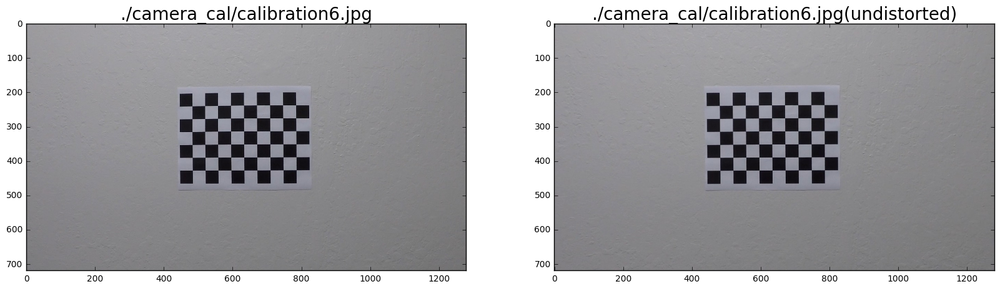

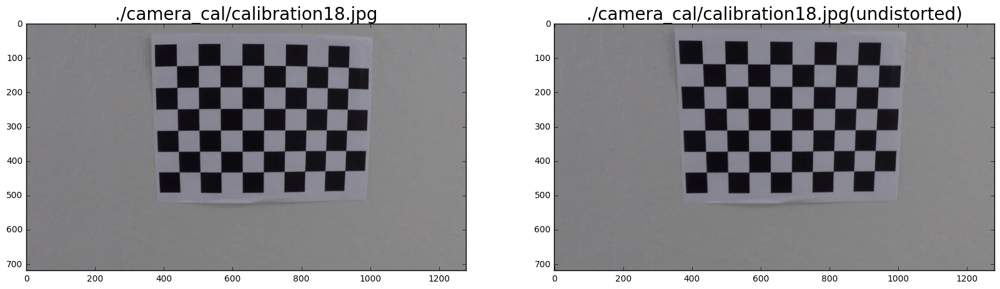

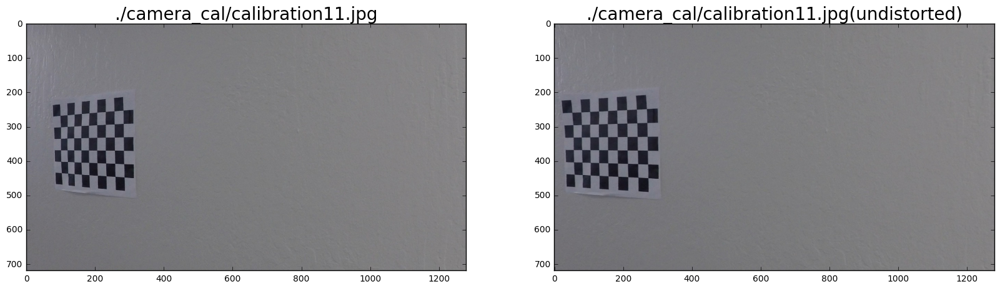

In [32]:
print("Showing undistorted 5 random images from calibration dataset:")
for file in random.sample(calib_files, 5):
    img = mpimg.imread(file)
    dst = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(file, fontsize=20)
    ax2.imshow(dst)
    ax2.set_title(file + "(undistorted)", fontsize=20)

    plt.show()

## Regin of interest masking

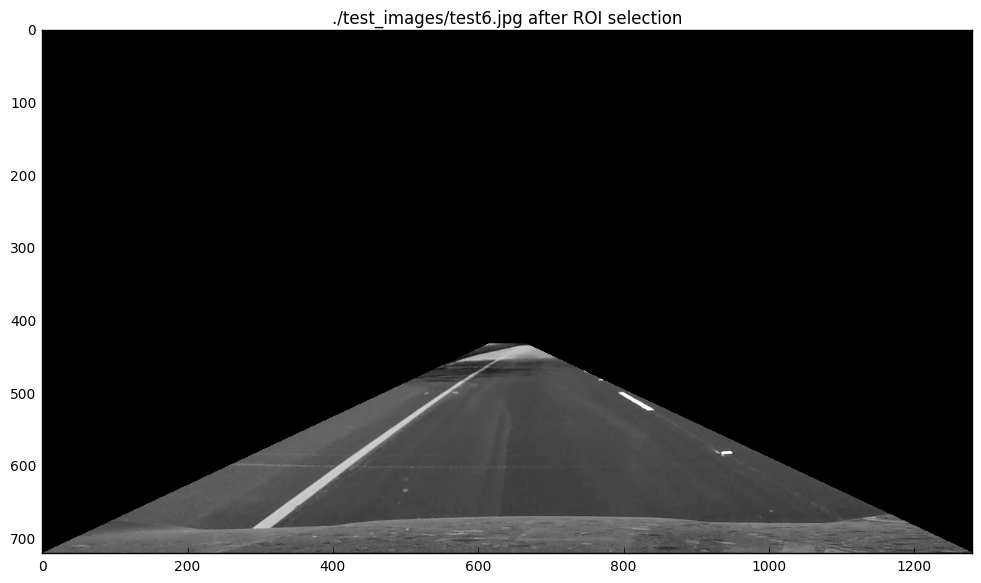

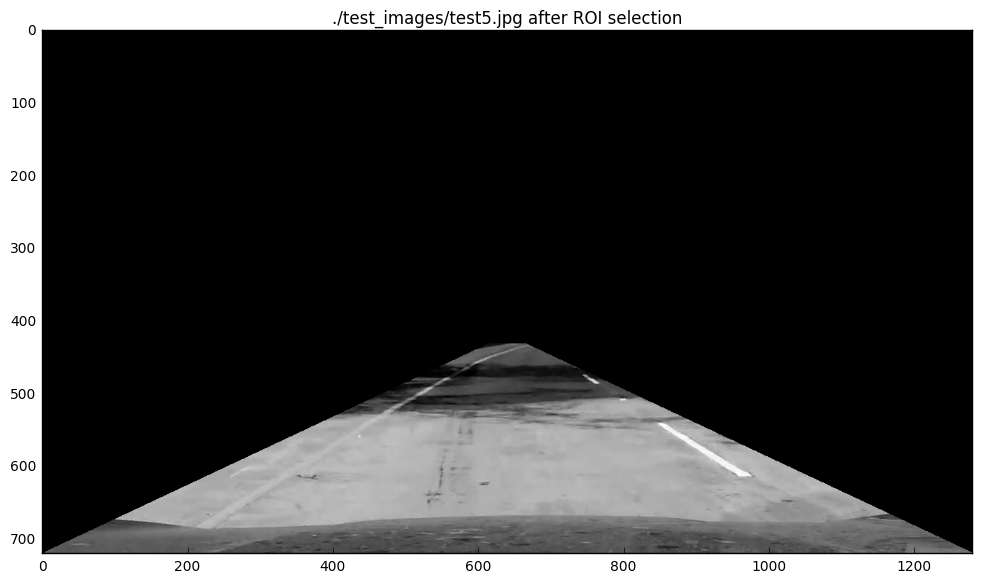

In [5]:
for file in random.sample(test_files, 2):
    img = mpimg.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    xsize, ysize = (img.shape[1], img.shape[0])

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),   \
                          (xsize*dist_from_side,     ysize*roi_height), \
                          (xsize*(1-dist_from_side), ysize*roi_height), \
                          (xsize,                    ysize) \
                         ]], dtype=np.int32)

    masked_img = region_of_interest(gray, vertices)
    if image_output:
        fig = plt.figure(figsize=plot_size)
        plt.title(file + " after ROI selection")
        plt.imshow(masked_img, cmap='gray')
        plt.show()


## Using colourspaces

Use components of different colourspaces to be invariant against changes in colour and luminance, for example be invariant against road markings in different colours.

Using the *saturation* channel S in colourspace *HLS* has exactly this advantage, it is only describing the changes in saturation but very invariant against changes in luminance and hues / colours.
This channel is therefore used in edge detection.

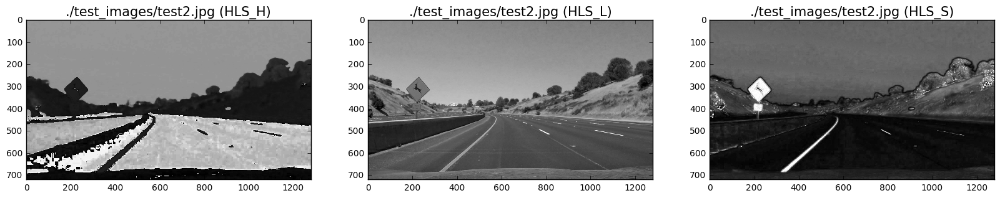

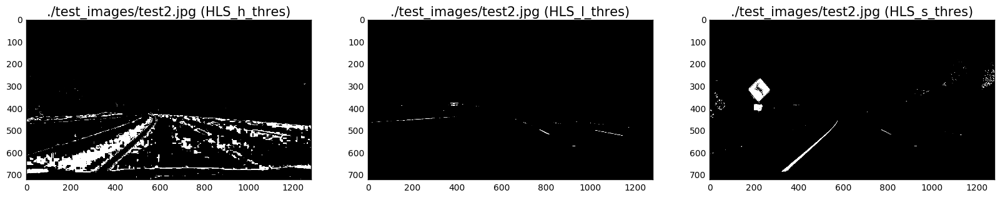

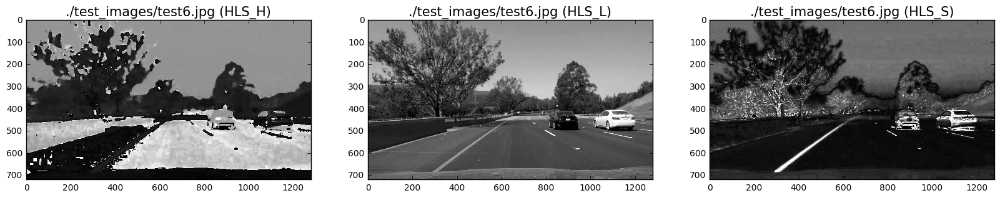

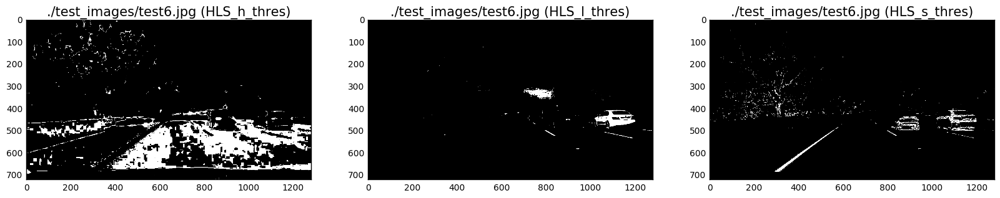

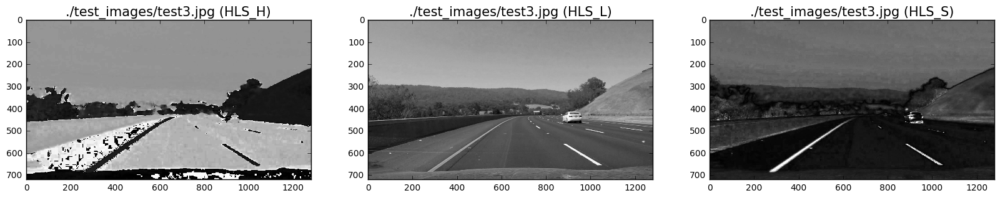

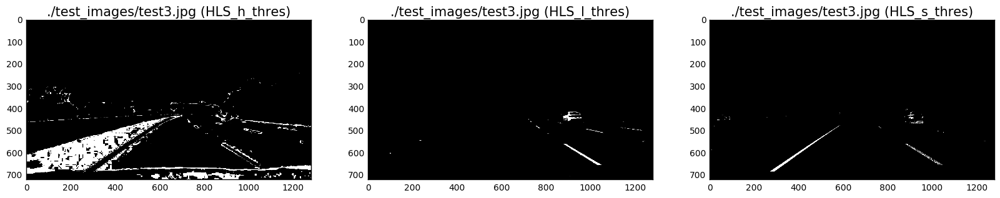

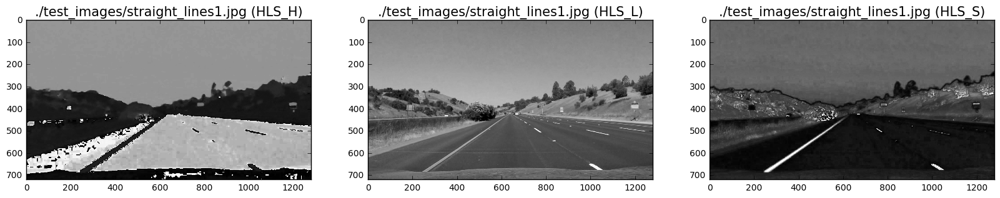

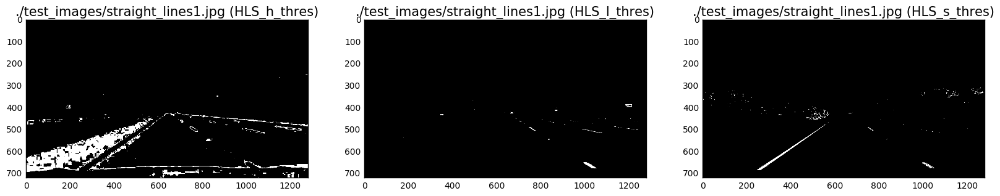

In [6]:
for file in random.sample(test_files, 4):
    img = mpimg.imread(file)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0] / np.max(hls[:,:,0])
    L = hls[:,:,1] / np.max(hls[:,:,1])
    S = hls[:,:,2] / np.max(hls[:,:,2])

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(H, cmap='gray')
    ax1.set_title(file + " (HLS_H)", fontsize=15)
    ax2.imshow(L, cmap='gray')
    ax2.set_title(file + " (HLS_L)", fontsize=15)
    ax3.imshow(S, cmap='gray')
    ax3.set_title(file + " (HLS_S)", fontsize=15)
    plt.show()
    
    thresh = (0.8, 1.0)
    binary_h = np.zeros_like(S)
    binary_l = np.zeros_like(S)
    binary_s = np.zeros_like(S)
    binary_h[(H > thresh[0]) & (H <= thresh[1])] = 1
    binary_l[(L > thresh[0]) & (L <= thresh[1])] = 1
    binary_s[(S > thresh[0]) & (S <= thresh[1])] = 1

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(binary_h, cmap='gray')
    ax1.set_title(file + " (HLS_h_thres)", fontsize=15)
    ax2.imshow(binary_l, cmap='gray')
    ax2.set_title(file + " (HLS_l_thres)", fontsize=15)
    ax3.imshow(binary_s, cmap='gray')
    ax3.set_title(file + " (HLS_s_thres)", fontsize=15)
    plt.show()

## Edge detection pipeline

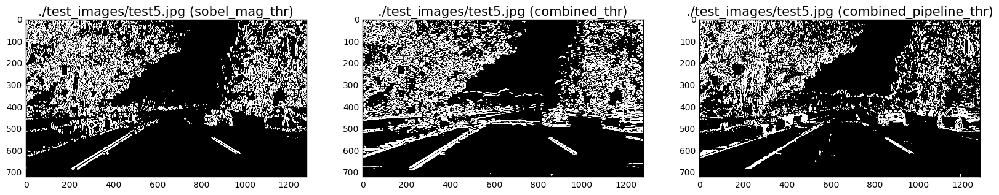

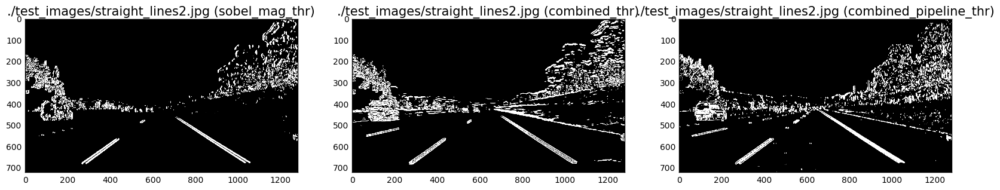

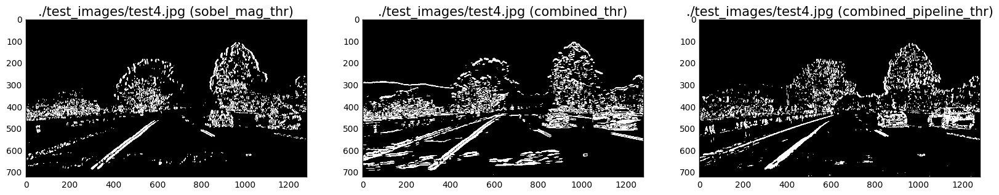

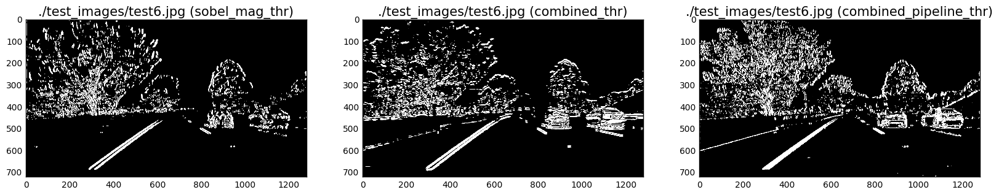

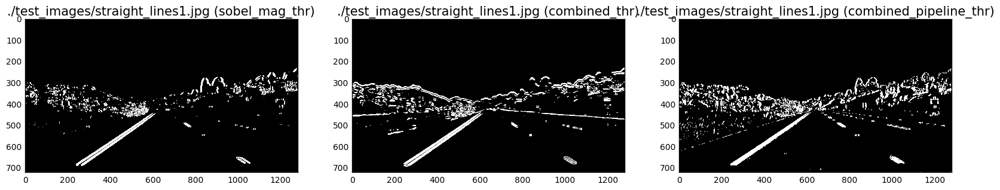

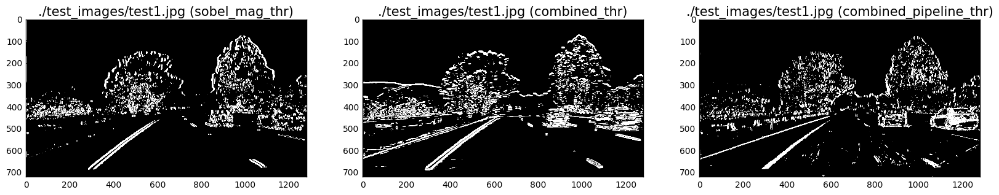

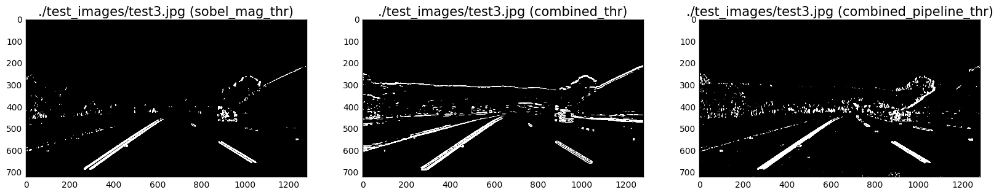

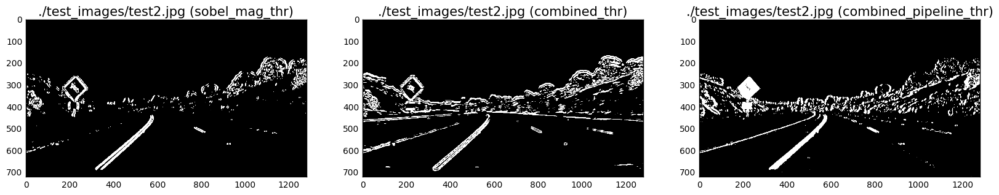

In [7]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=15, thresh=(0.2, 1.0)):
    if orient == 'x':
        sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    else:
        sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    sobel = sobel/np.max(sobel)
    grad_binary = np.zeros_like(sobel)
    grad_binary[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
    return grad_binary


def mag_thresh(image, sobel_kernel=15, thresh=(0.2, 0.8)):
    sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = sobel/np.max(sobel)
    mag_binary = np.zeros_like(sobel)
    mag_binary[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
    return mag_binary


def dir_threshold(image, sobel_kernel=15, thresh=(0, np.pi/2)):
    sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    sobel_angle = np.arctan2(sobely, sobelx)
    dir_binary = np.zeros_like(sobel_angle)
    dir_binary[(sobel_angle >= thresh[0]) & (sobel_angle <= thresh[1])] = 1
    return dir_binary


def pipeline(image, sobel_kernel=15, s_thresh=(0.1, 1.0), sx_thresh=(0.2, 0.9)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0] / np.max(hls[:,:,0])
    L = hls[:,:,1] / np.max(hls[:,:,1])
    S = hls[:,:,2] / np.max(hls[:,:,2])
    R = image[:,:,0] / np.max(image[:,:,0]) # Pick red channel from RGB image
    
    # Sobel x
    sxbinary = abs_sobel_thresh(R, orient='x', sobel_kernel=sobel_kernel, thresh=sx_thresh)
    
    # Threshold color channel
    s_binary = np.zeros_like(S)
    s_binary[(S >= s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(sxbinary == 1) | (s_binary == 1)] = 1
    
    return combined_binary


# Choose a Sobel kernel size
ksize = 21 # Choose a larger odd number to smooth gradient measurements
sobel_thresh = (0.11, 0.7)
sobel_mag_thresh = (0.11, 0.7)
sobel_dir_thresh = (np.pi/4, np.pi/2)
hls_s_thresh = (0.6, 1.0)

for file in random.sample(test_files, 8):
    img = mpimg.imread(file)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    S = hls[:,:,2] / np.max(hls[:,:,2])
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(S, orient='x', sobel_kernel=ksize, thresh=sobel_thresh)
    grady = abs_sobel_thresh(S, orient='y', sobel_kernel=ksize, thresh=sobel_thresh)
    mag_binary = mag_thresh(S, sobel_kernel=ksize, thresh=sobel_mag_thresh)
    dir_binary = dir_threshold(S, sobel_kernel=ksize, thresh=sobel_dir_thresh)

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    combined_pipeline = pipeline(img, sobel_kernel=ksize, s_thresh=hls_s_thresh, sx_thresh=sobel_thresh)

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(gradx, cmap='gray')
    ax1.set_title(file + " (sobel_mag_thr)", fontsize=15)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title(file + " (combined_thr)", fontsize=15)
    ax3.imshow(combined_pipeline, cmap='gray')
    ax3.set_title(file + " (combined_pipeline_thr)", fontsize=15)
    plt.show()

## Unwarping images

In this section we essentially estimate the camera to road plane warping transformation.
We need to do this in order to project the camera angle into a birds-eye angle onto the road.

src:
[[  614.4000   432.0000]
 [  665.6000   432.0000]
 [ 1230.0000   720.0000]
 [   50.0000   720.0000]]
dst:
[[   50.0000    50.0000]
 [ 1230.0000    50.0000]
 [ 1230.0000   670.0000]
 [   50.0000   670.0000]]
M:
[[   -0.7186    -1.5277  1099.9269]
 [    0.0000    -1.6664   718.3313]
 [    0.0000    -0.0024     1.0000]]


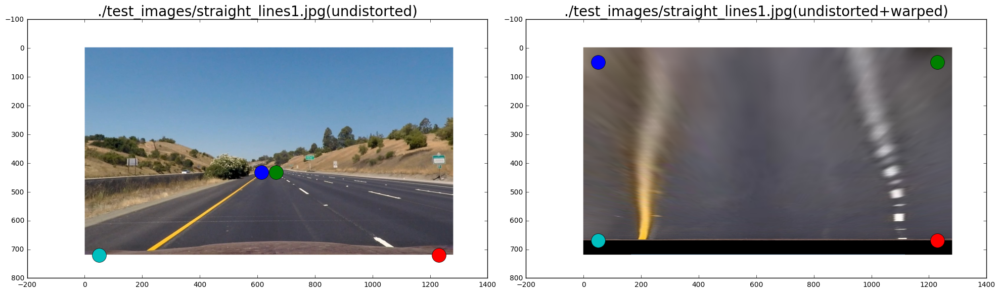

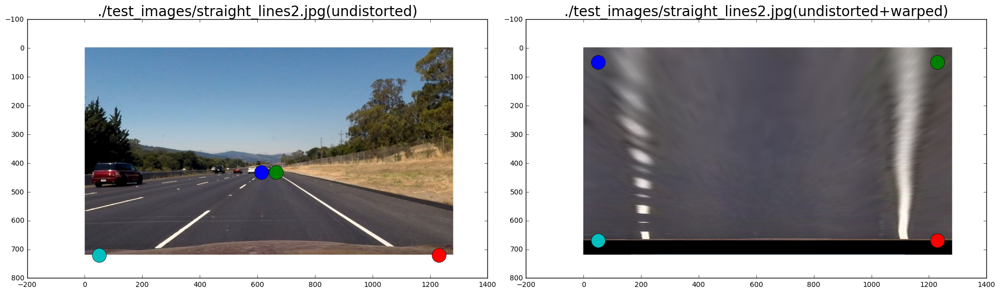

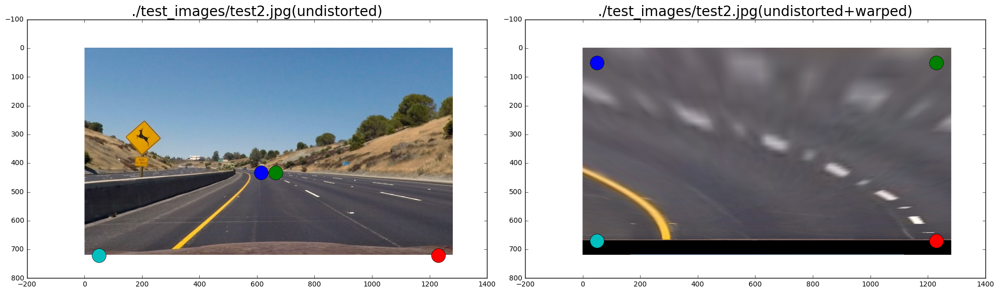

In [60]:
offset = 50 # distance from outer corners of undistorted image to the border in unwarped perspective

def order_points(pts):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4, 2), dtype = "float32")

    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    # return the ordered coordinates
    return rect


img = mpimg.imread(test_files[0])
xsize, ysize = img_size = (img.shape[1], img.shape[0])
src = np.array([[xsize*dist_from_side,     ysize*roi_height],
                [xsize*(1-dist_from_side), ysize*roi_height],
                [xsize-offset,             ysize],
                [offset,                   ysize]], dtype=np.float32)
dst = np.array([[offset,        offset],
                [xsize-offset,  offset], 
                [xsize-offset,  ysize-offset],
                [offset,        ysize-offset]], dtype=np.float32)

print("src:\n%s" % src)
print("dst:\n%s" % dst)

M = cv2.getPerspectiveTransform(src, dst)
print("M:\n%s" % M)

for file in random.sample(test_files, 3):
    img = mpimg.imread(file)
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(img, M, img_size)
    
    # Visualize unwarped image next to the undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    ax1.imshow(undist)
    for coord in src:
        ax1.plot(coord[0], coord[1], 'o', markersize=20)
    ax1.set_title(file + "(undistorted)", fontsize=20)
    
    ax2.imshow(warped)
    for coord in dst:
        ax2.plot(coord[0], coord[1], 'o', markersize=20)
    ax2.set_title(file + "(undistorted+warped)", fontsize=20)

    plt.tight_layout()
    plt.show()

Couldn't detect both road lanes in the list of lines, 14 left and 0 right :(


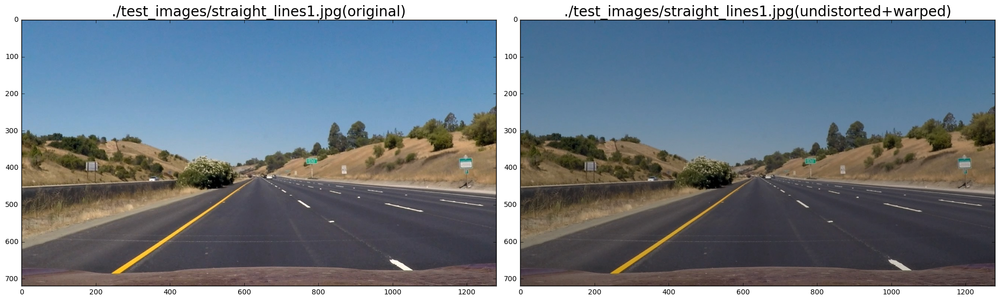

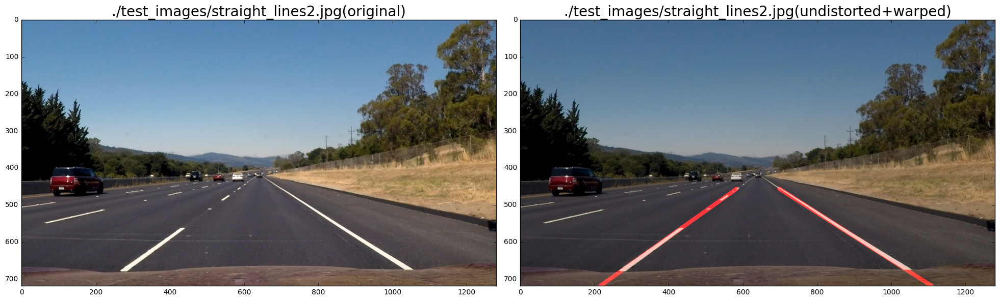

Couldn't detect both road lanes in the list of lines, 16 left and 0 right :(


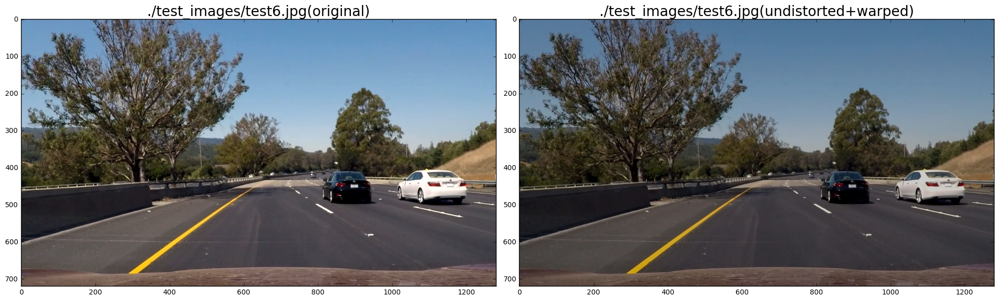

In [26]:
# Kernel size for gaussian smoothing
kernel_size = 5

annotate_all_lines = False

# Canny edge detectiion parameters
canny_low_threshold  = 100
canny_high_threshold = 200

# Parameters for ROI selection
roi_height = 0.6
dist_from_side = 0.5 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255

# Parameters for hough line extraction
hough_rho = 1
hough_theta = np.pi / 360
hough_threshold = 20
hough_min_line_len = 80
hough_max_line_gap = 50

# Slope threshold for line filtering and extrapolation
slope_threshold_low  = 0.5
slope_threshold_high = 0.8

for file in random.sample(test_files, 3):
    img = mpimg.imread(file)
    lines = process_image(img)
    # Visualize unwarped image next to the undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    ax1.imshow(img)
    ax1.set_title(file + "(original)", fontsize=20)
    
    ax2.imshow(lines)
    ax2.set_title(file + "(undistorted+warped)", fontsize=20)

    plt.tight_layout()
    plt.show()

## Lane detection

Two approaches considered:
* Sliding window with convolutoin
* Histogram

In [9]:
def ransac_polyfit(x, y, order=3, n=20, k=100, t=0.1, d=100, f=0.8):
    # Thanks https://en.wikipedia.org/wiki/Random_sample_consensus
    # n – minimum number of data points required to fit the model
    # k – maximum number of iterations allowed in the algorithm
    # t – threshold value to determine when a data point fits a model
    # d – number of close data points required to assert that a model fits well to data
    # f – fraction of close data points required

    besterr = np.inf
    bestfit = None
    for kk in xrange(k):
        maybeinliers = np.random.randint(len(x), size=n)
        maybemodel = np.polyfit(x[maybeinliers], y[maybeinliers], order)
        alsoinliers = np.abs(np.polyval(maybemodel, x)-y) < t
        if sum(alsoinliers) > d and sum(alsoinliers) > len(x)*f:
            bettermodel = np.polyfit(x[alsoinliers], y[alsoinliers], order)
            thiserr = np.sum(np.abs(np.polyval(bettermodel, x[alsoinliers])-y[alsoinliers]))
            if thiserr < besterr:
                bestfit = bettermodel
                besterr = thiserr
    return bestfit